In [4]:
import torch
from sklearn.model_selection import train_test_split

# load data from data folder(we"re in notebooks folder)
sim_arr_tensor = torch.load('./data/sim_arr_tensor.pt')

# train test split
train_data, test_data = train_test_split(
    sim_arr_tensor, test_size=0.2, random_state=42)
train_data, val_data = train_test_split(
    train_data, test_size=0.2, random_state=42)

/tmp/ipykernel_1478291/1126774367.py:5: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  sim_arr_tensor = torch.load('./data/sim_arr_tensor.pt')


In [5]:
from torch import nn

num_layers = 5
poolsize = [2, 2, 2, 2, 5]
channels = [3, 12, 7, 7, 11, 12]
kernel_sizes = [15, 10, 14, 14, 14]
dilations = [5, 5, 3, 3, 1]
activations = [nn.SiLU, nn.Tanh, nn.Softplus, nn.SiLU, nn.SiLU]
learning_rate = 0.0002568457560593339
batch_size = 32
epochs = 400

/home/tummalas/hyper-param-optim-4-vector-field-clustering/models/train_cluster.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  sim_arr_tensor = torch.load('./data/sim_

Epoch 1/400
              Train Loss: 138998.7642
              Val Loss: 128534.7358
Epoch 2/400
              Train Loss: 131057.6005
              Val Loss: 115714.8035
Epoch 3/400
              Train Loss: 109976.7820
              Val Loss: 99000.0437
Epoch 4/400
              Train Loss: 98783.0813
              Val Loss: 88039.6465
Epoch 5/400
              Train Loss: 69838.3157
              Val Loss: 46648.8906
Epoch 6/400
              Train Loss: 44322.1454
              Val Loss: 37407.3529
Epoch 7/400
              Train Loss: 38931.9820
              Val Loss: 34787.8958
Epoch 8/400
              Train Loss: 36595.9714
              Val Loss: 32854.8268
Epoch 9/400
              Train Loss: 34891.1941
              Val Loss: 31257.0607
Epoch 10/400
              Train Loss: 33591.1879
              Val Loss: 30404.3425
Epoch 11/400
              Train Loss: 32542.2282
              Val Loss: 29132.8770
Epoch 12/400
              Train Loss: 31588.2970
              Val L

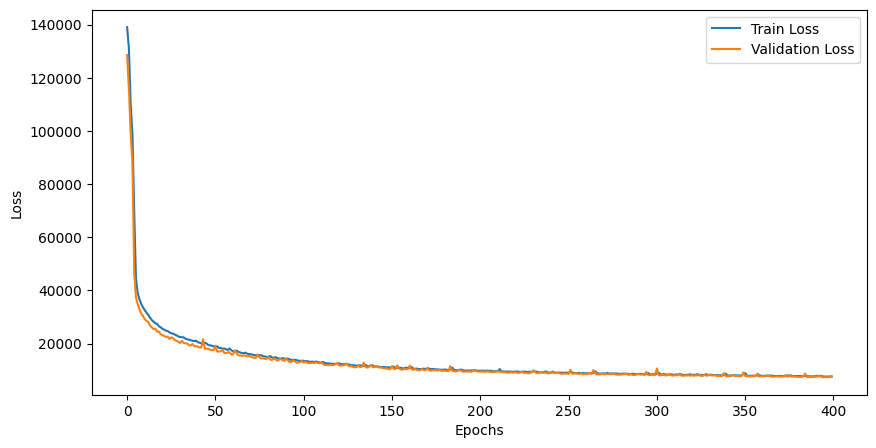

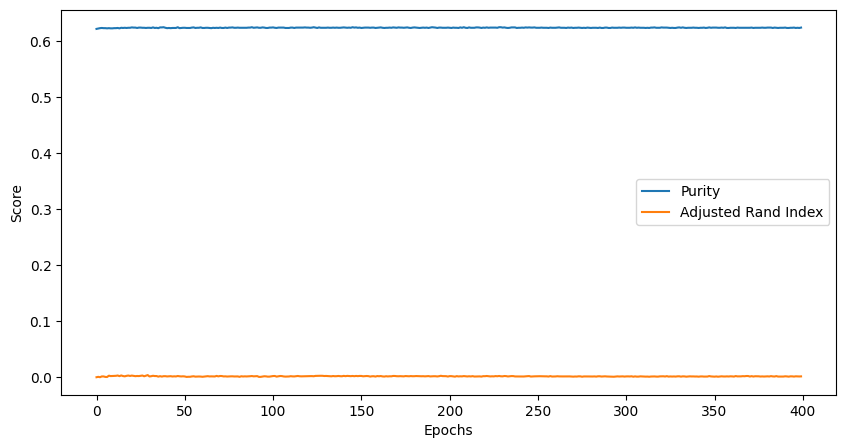

Test Loss: 256.0660


256.0660177338559

In [6]:
from models import vanilla
from models import train_cluster, evaluate

encoder = vanilla.Encoder(num_layers, poolsize, channels,
                          kernel_sizes, dilations, activations)
decoder = vanilla.Decoder(encoder)
model = vanilla.AutoEncoder(encoder, decoder)

train_cluster(model, train_data, val_data,
      lr=learning_rate,
      batch_size=batch_size,
      epochs=epochs)
# model.load_state_dict(torch.load('./saved_models/vanilla_model.pt'))
evaluate(model, test_data,
         batch_size=batch_size)

#torch.save(model, './saved_models/vanilla_model.pt')

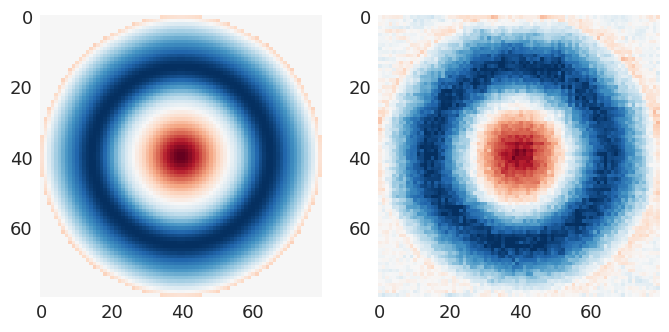

In [7]:
from plot import random_recon
random_recon(model, test_data)

In [8]:
from sklearn.cluster import HDBSCAN
from cluster_acc import purity, adj_rand_index

feature_array = model.feature_array(sim_arr_tensor)

clustering = HDBSCAN(min_cluster_size=5, cluster_selection_epsilon=0.5).fit(feature_array)
labels = clustering.labels_

print(f'Purity: {purity(labels)}')
print(f'ARI: {adj_rand_index(labels)}')

Purity: 0.6166112956810631
ARI: -0.006947806322573319


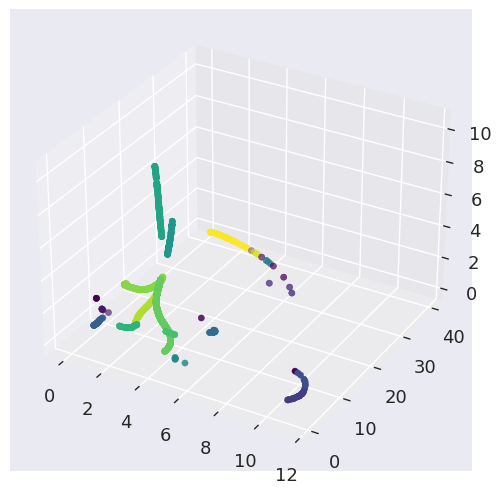

In [9]:
# plot the feature array in 3D with the labels as colors
import matplotlib.pyplot as plt

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
# feature_array = feature_array[0].detach().to('cpu').numpy()
ax.scatter(feature_array[:, 0], feature_array[:, 1],
           feature_array[:, 2], c=labels)

In [10]:
from plot import class_config
class_config(labels)

Number of classes:  17


ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

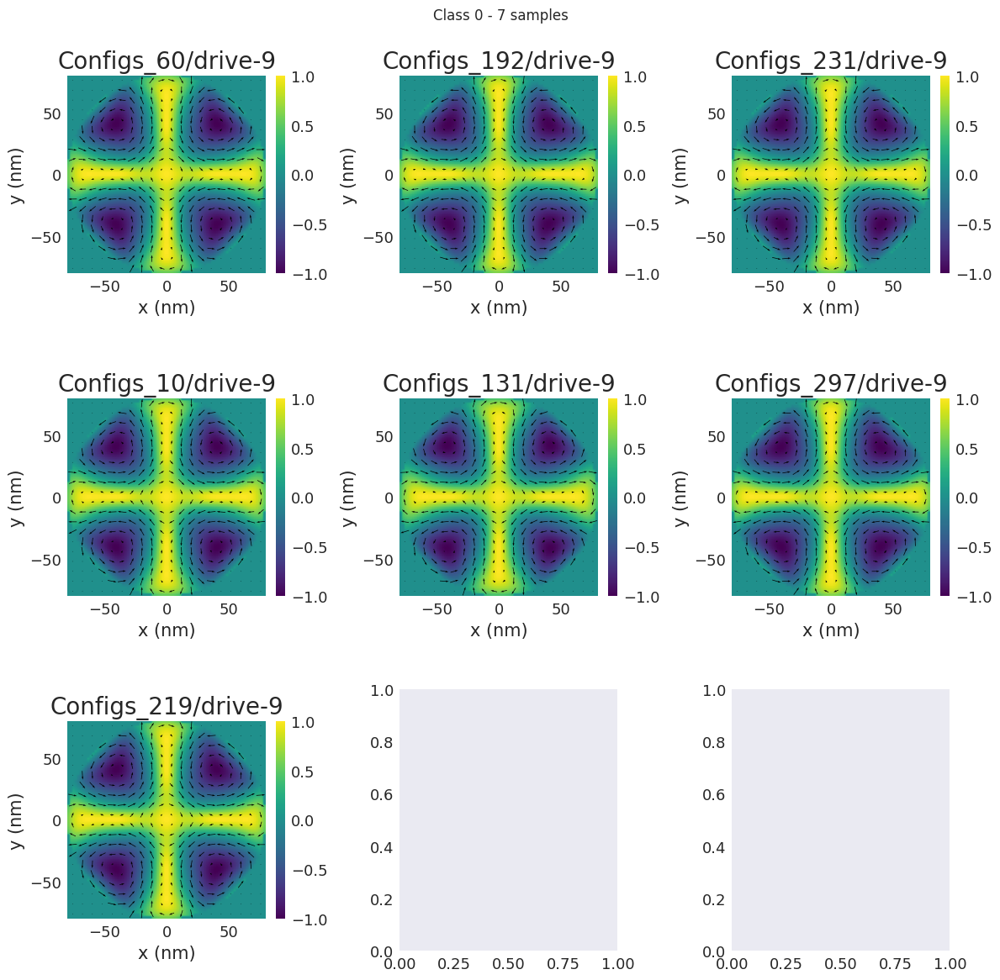

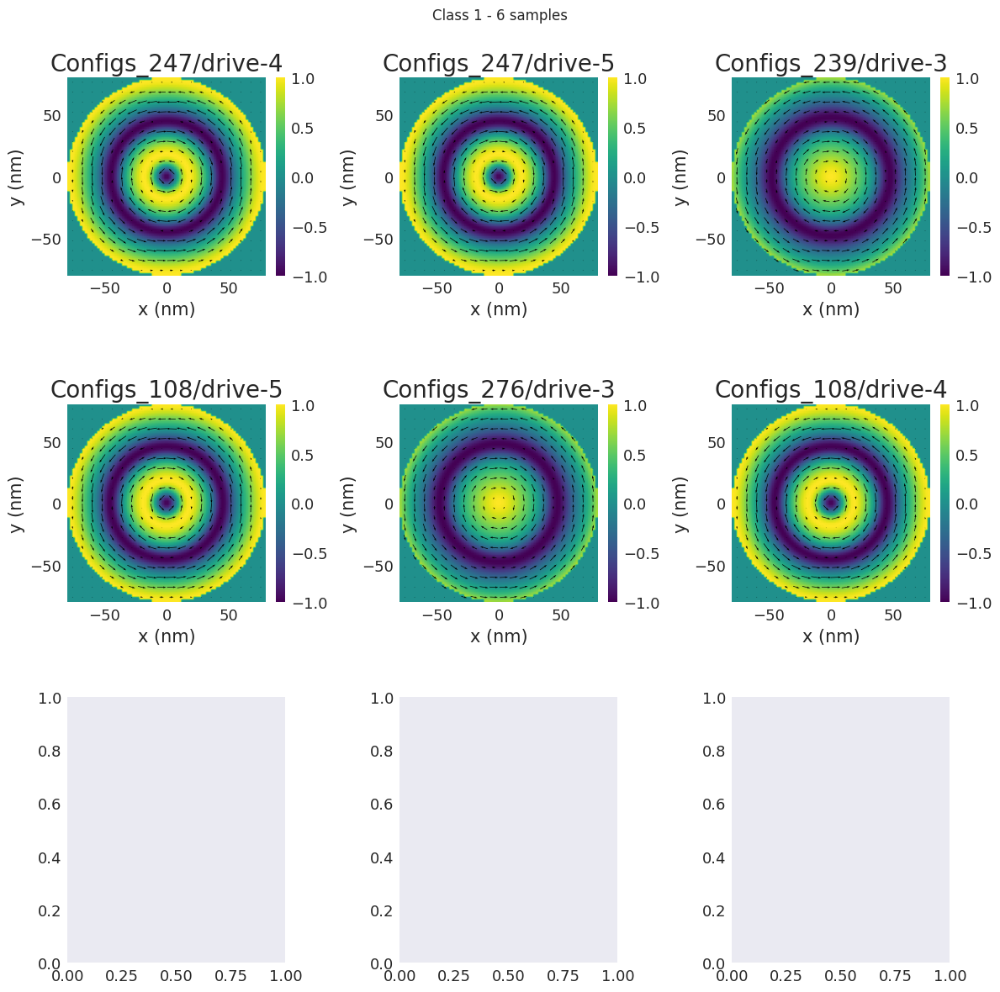

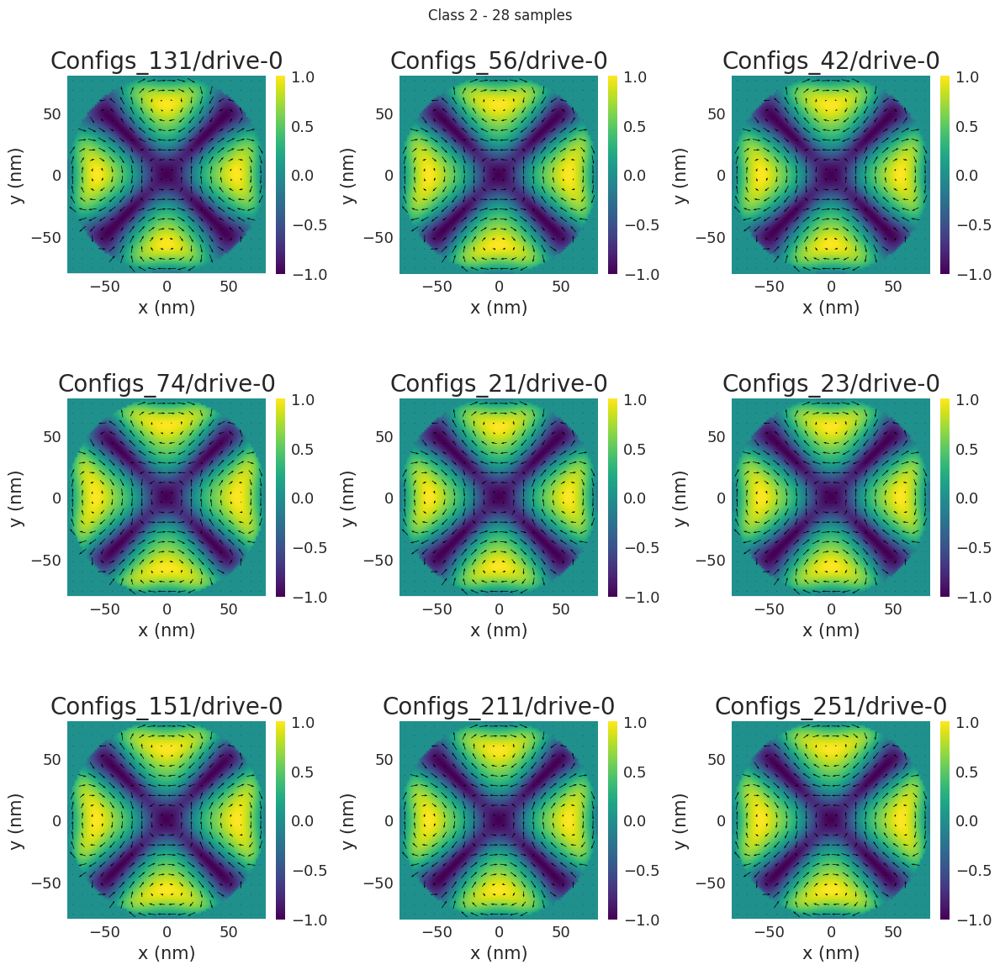

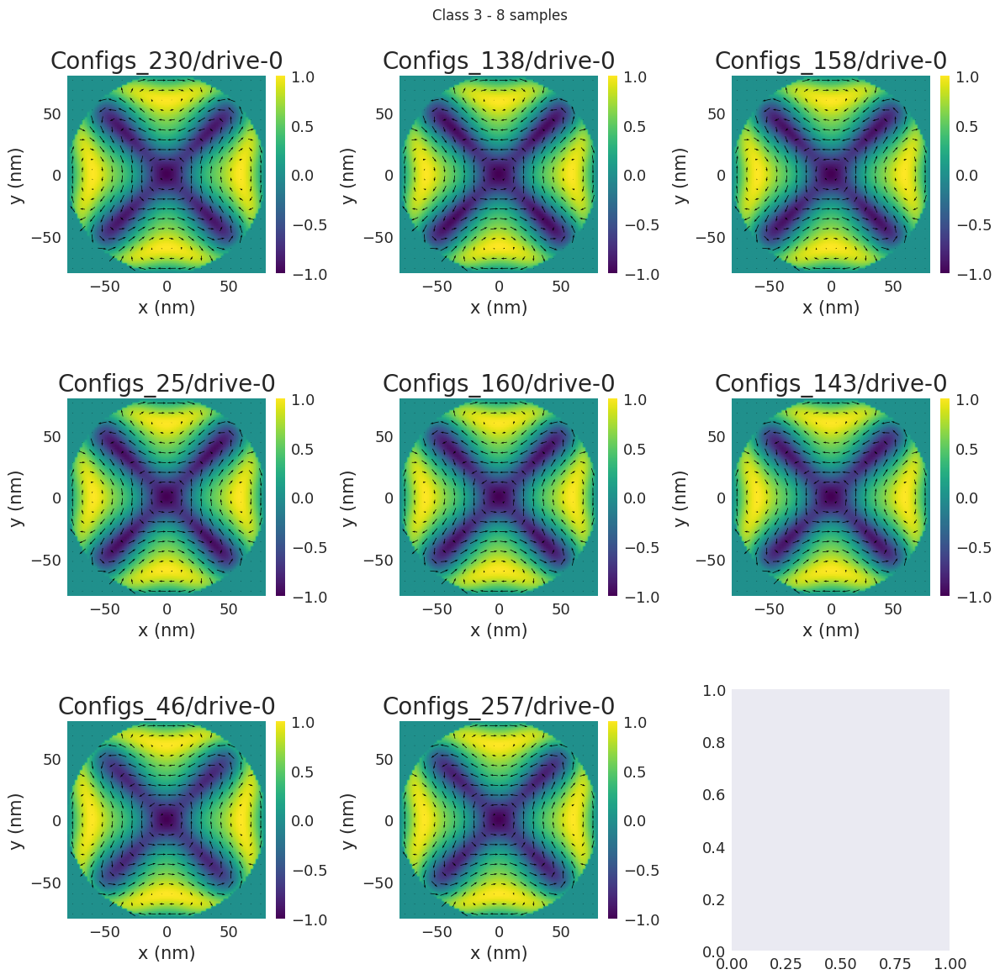

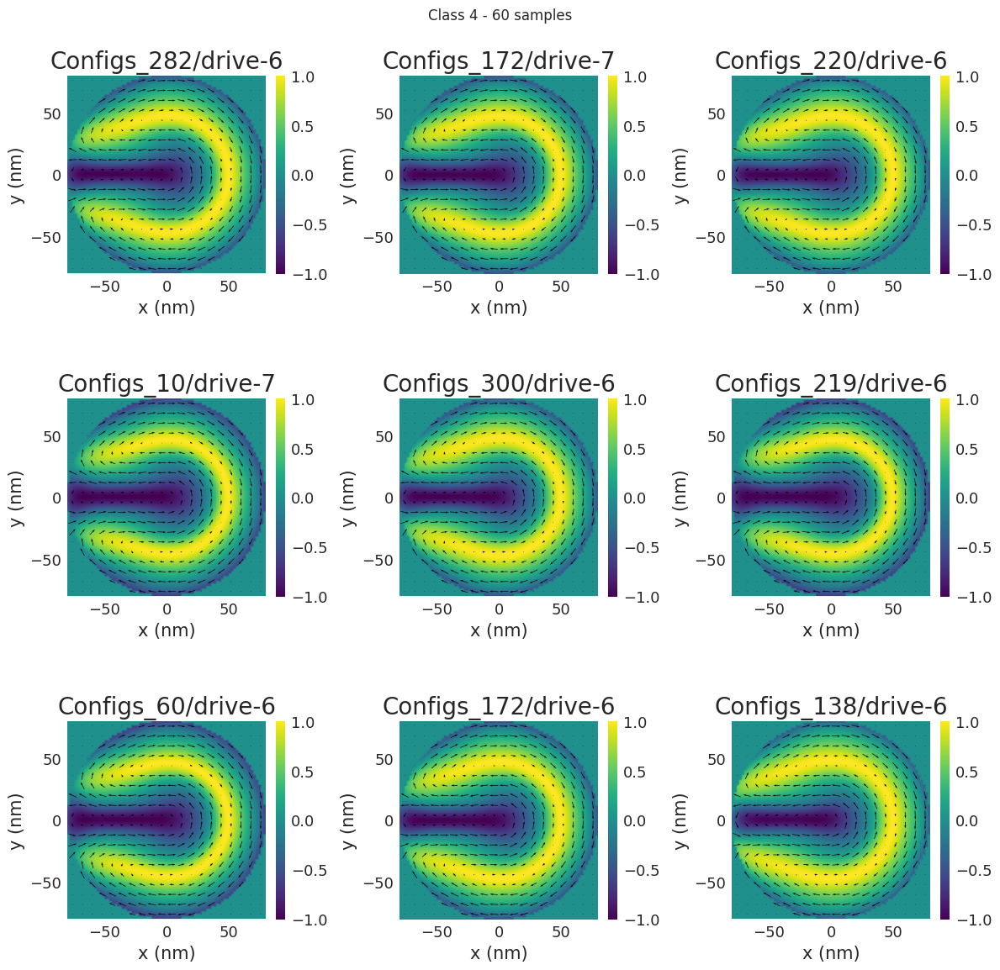

...

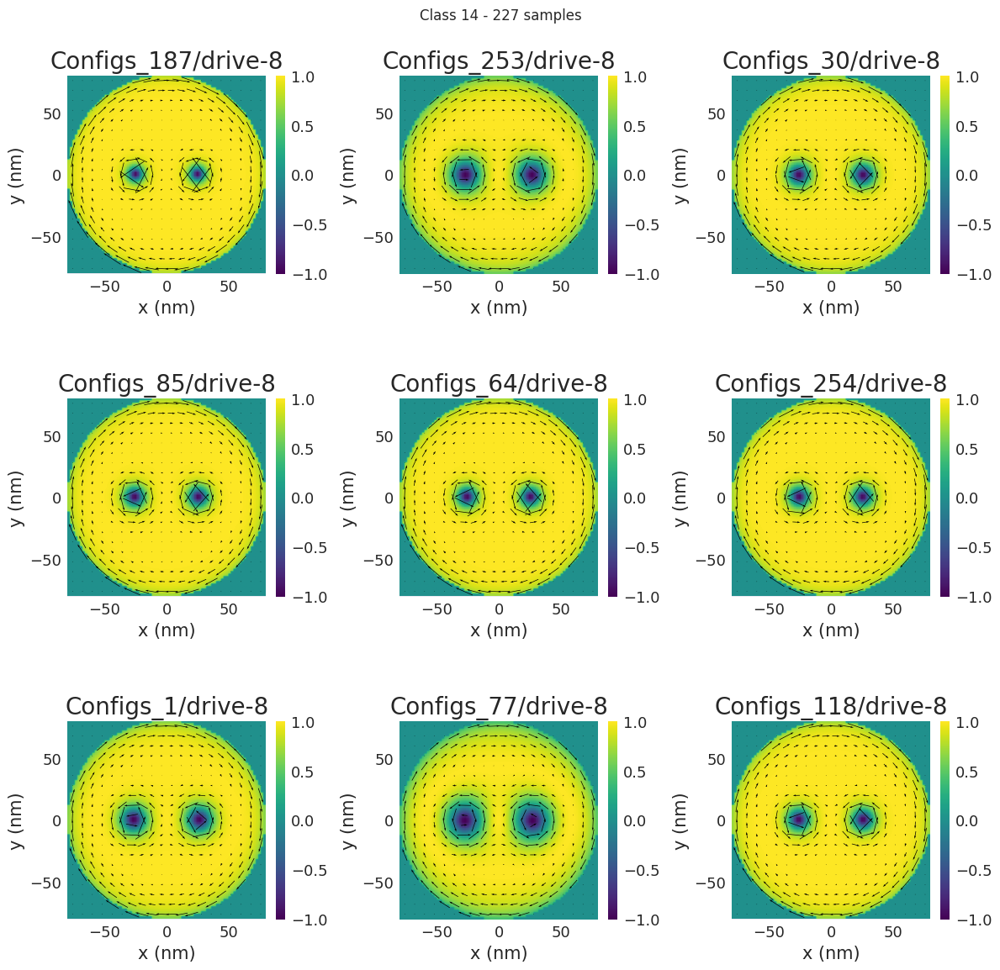

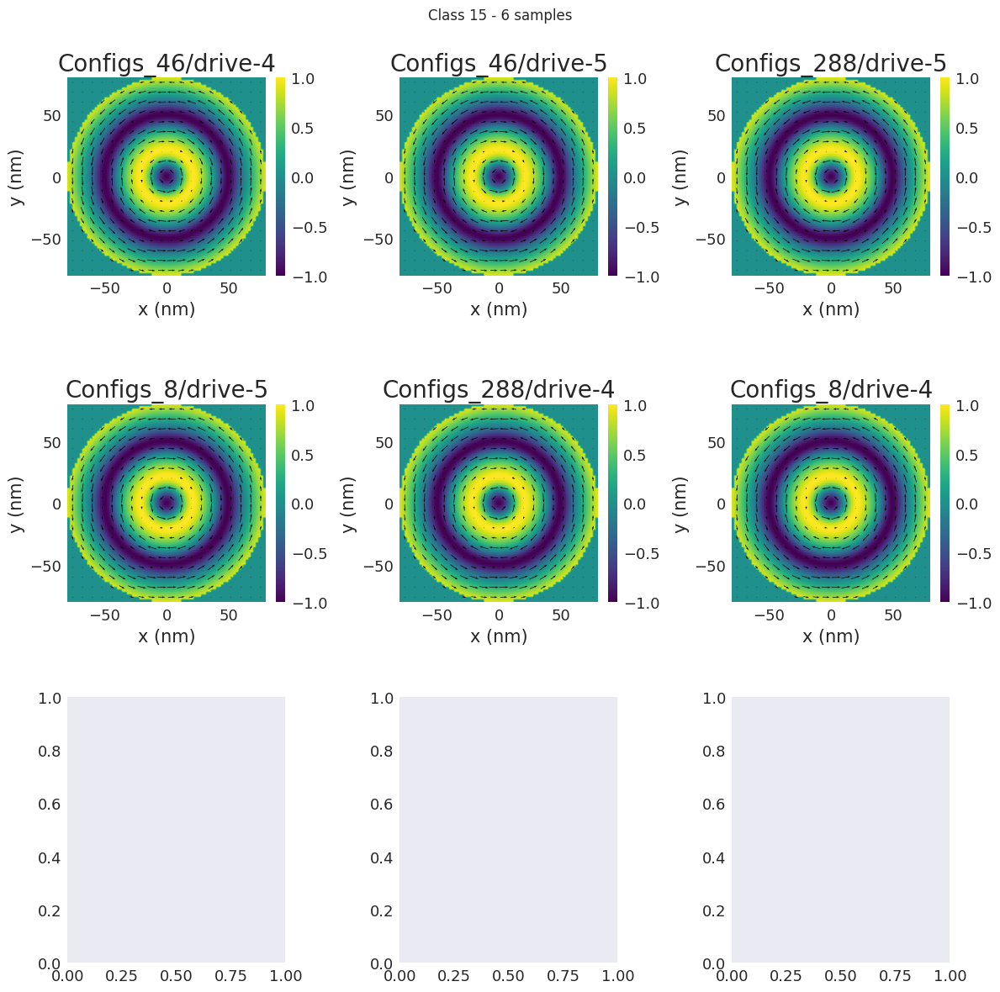

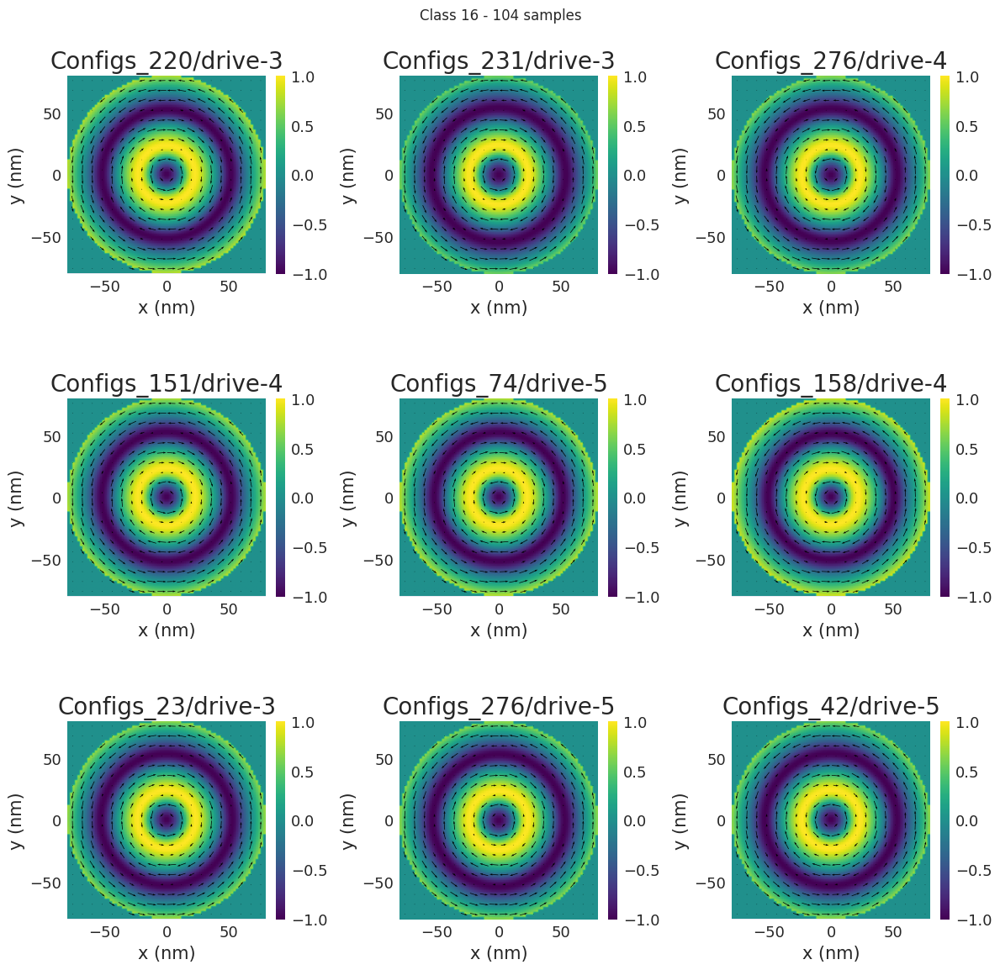

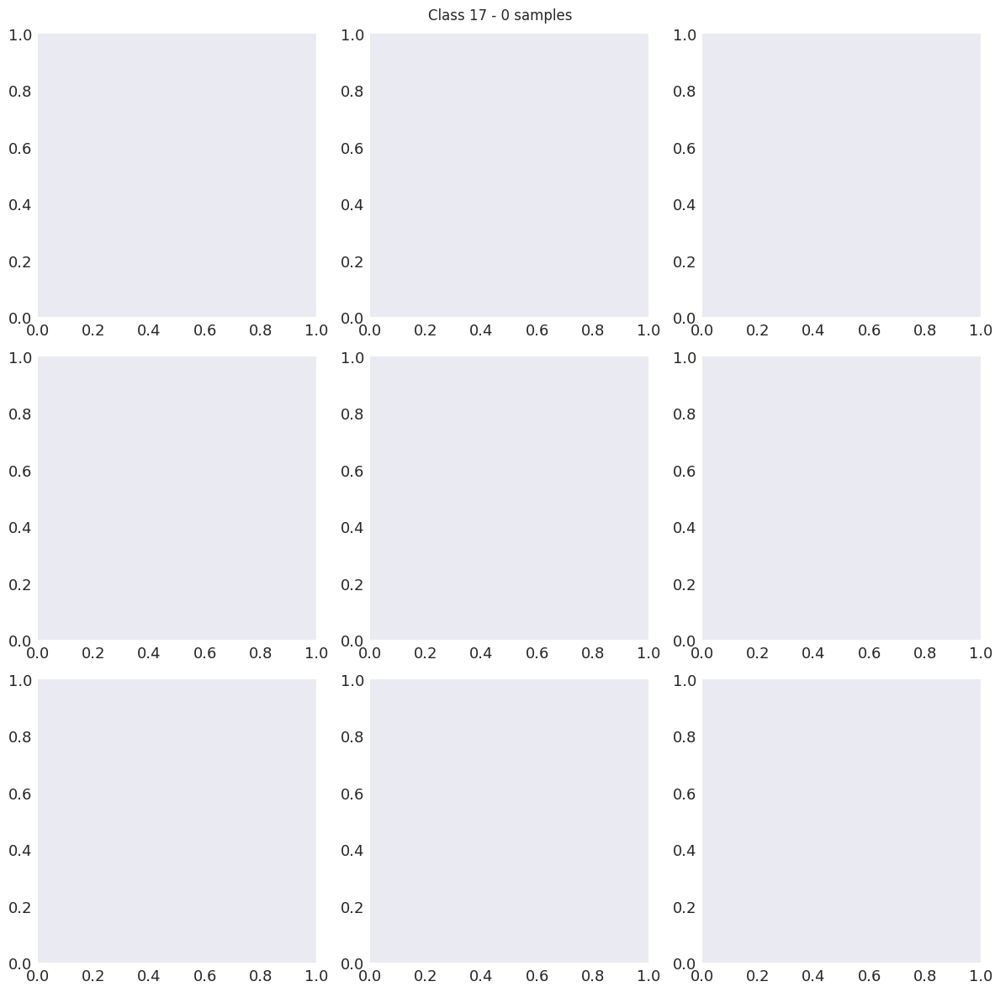

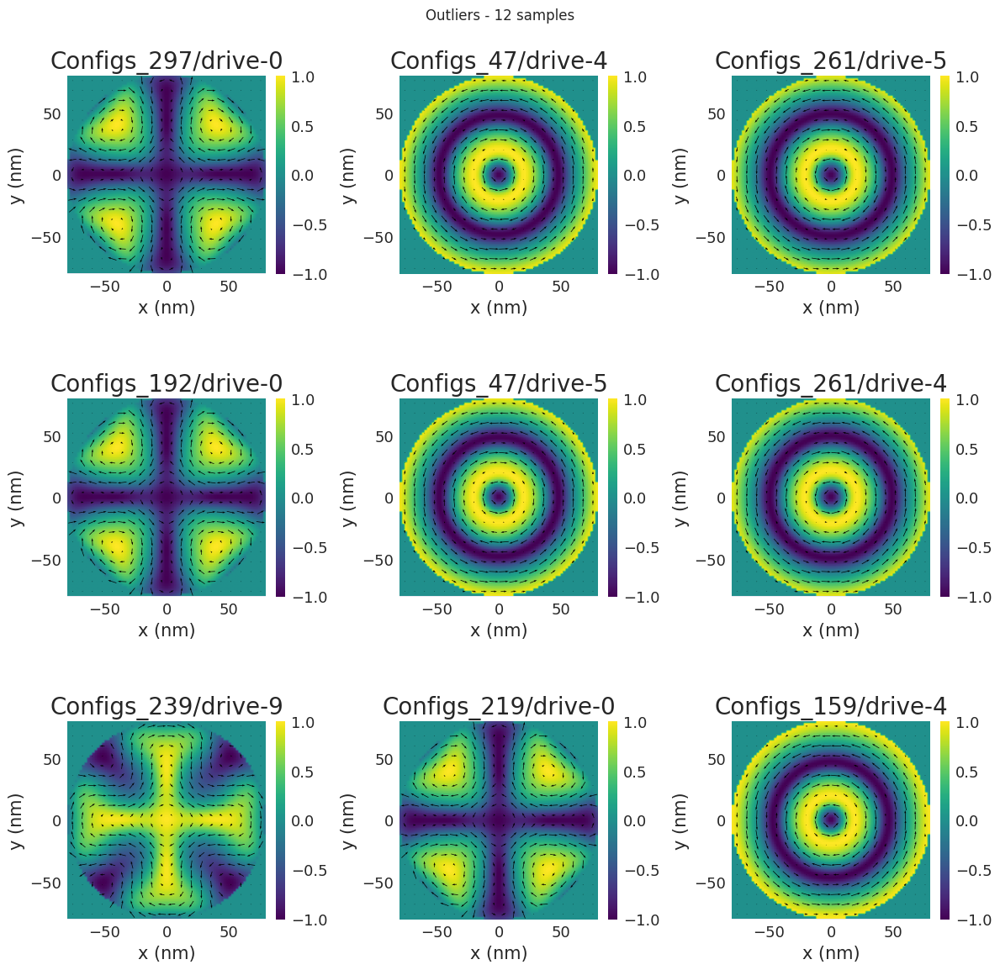

In [11]:
from plot import plot_all_examples

plot_all_examples(labels)